# 3.Filters

In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random

In [2]:
def mse(A, B, ax=None):
    '''
    ax = 0: the average is performed along the row, for each column, returning an array
    ax = 1: the average is performed along the column, for each row, returning an array
    ax = None: the average is performed element-wise along the array, returning a scalar value
    '''
    return ((A - B)**2).mean(axis=ax)

## 3.1. Box Filters

**3.1.1. What is the resulting filter if apply the 3 × 3 box filter many times? (Test on grayscale Lena Image).**

In [3]:
src_path = './Images/3/Lena.bmp'
src = cv2.imread(src_path, cv2.IMREAD_GRAYSCALE)

In [3]:
def pad(src, pad_size):
    return np.pad(src, ( (pad_size, pad_size), ( pad_size, pad_size) ) )

In [4]:
def box_filter(src, kernel_size):
    
    height, width = src.shape
    
    pad_size = kernel_size // 2
    src_padded = pad(src, pad_size)
    height_padded, width_padded = src_padded.shape
    src_padded[:, :] = 0
    src_padded[pad_size : height + pad_size, pad_size : width + pad_size] = src
    
    dst = np.zeros_like(src_padded, dtype=float)
    
    for i in range(height_padded):
        for j in range(width_padded):
            if i < height_padded - kernel_size and j < width_padded - kernel_size:
                dst[i + 1, j + 1] = np.mean(src_padded[i: i + kernel_size, j: j + kernel_size])
    
    return dst[pad_size : height + pad_size, pad_size : width + pad_size]

In [6]:
loop_count = [25, 50, 100]
mean_filter_results = []

In [79]:
for i in range(len(loop_count)):
    src = cv2.imread(src_path, cv2.IMREAD_GRAYSCALE)
    current_loop_count = loop_count[i]
    for j in range(current_loop_count):
        src = box_filter(src, 3)
    mean_filter_results.append(src)
    print('result ' + str(i) + ' with loop_count=' + str(loop_count[i]) + ' is done!')

result 0 with loop_count=25 is done!
result 1 with loop_count=50 is done!
result 2 with loop_count=100 is done!


In [7]:
src = cv2.imread(src_path, cv2.IMREAD_GRAYSCALE)

In [89]:
mean_filter_results_0 = mean_filter_results[0].astype(np.uint8)
mean_filter_results_1 = mean_filter_results[1].astype(np.uint8)
mean_filter_results_2 = mean_filter_results[2].astype(np.uint8)

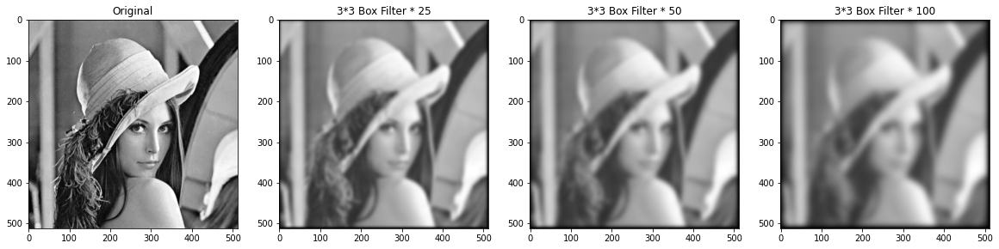

In [90]:
plt.figure(figsize=(20,10))

plt.subplot(1, 4, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(1, 4, 2)
plt.title("3*3 Box Filter * 25")
plt.imshow(mean_filter_results_0, cmap='gray')

plt.subplot(1, 4, 3)
plt.title("3*3 Box Filter * 50")
plt.imshow(mean_filter_results_1, cmap='gray')

plt.subplot(1, 4, 4)
plt.title("3*3 Box Filter * 100")
plt.imshow(mean_filter_results_2, cmap='gray')

plt.show()

In [97]:
cv2.imwrite('./Output Images/3/Mean_Filter_33_25.bmp', mean_filter_results_0)
cv2.imwrite('./Output Images/3/Mean_Filter_33_50.bmp', mean_filter_results_1)
cv2.imwrite('./Output Images/3/Mean_Filter_33_100.bmp', mean_filter_results_2)

True

###### Report MSE

In [98]:
data = {'3*3 Box Filter * 25': [mse(src, mean_filter_results_0)],
        '3*3 Box Filter * 50': [mse(src, mean_filter_results_1)],
        '3*3 Box Filter * 100': [mse(src, mean_filter_results_2)],
        
        }

index =['Original']
df = pd.DataFrame(data, index=index)

df.head()

,3*3 Box Filter * 25,3*3 Box Filter * 50,3*3 Box Filter * 100
Original,54.062916,64.414234,75.848614


## 3.2. Median Filter

**3.2.1. Write a program that can, first, add salt-and-pepper noise to an image with a specified noise density. Try different
noise density (0.05, 0.1, 0.2). Then, perform median filtering with a specified window size. Consider only the
median filter with a square shape. For each density, discuss the effect of filtering with different window sizes
(3, 5, 7, 9) and experimentally determine the best window size. Note: you can use imnoise and immse functions
to generate noisy images and compare the quality of images, respectively. Also, you can ignore the boundary
problem by only performing the filtering for the pixels inside the boundary. (Test on grayscale Lena Image).**

In [5]:
def add_salt_and_pepper(src, density):
    height, width = src.shape
    dst = np.zeros(shape=(height, width), dtype=np.uint8)
    threshold = 1 - density
    for i in range(height):
        for j in range(width):
            rnd = random.random()
            if rnd < density:
                dst[i, j] = 0
            elif rnd > threshold:
                dst[i, j] = 255
            else:
                dst[i, j] = src[i, j]

    return dst

In [101]:
salt_and_pepper_005 = add_salt_and_pepper(src, 0.05)
salt_and_pepper_01 = add_salt_and_pepper(src, 0.1)
salt_and_pepper_02 = add_salt_and_pepper(src, 0.2)

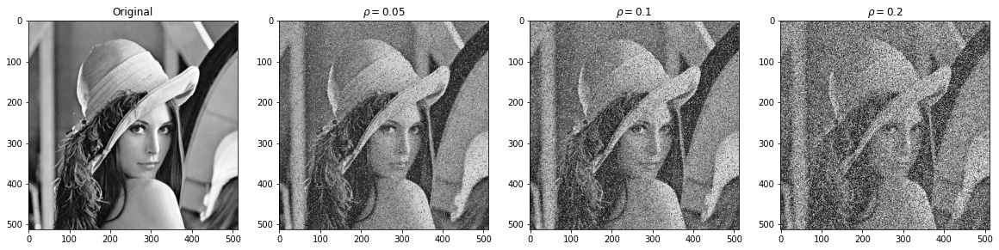

In [102]:
plt.figure(figsize=(20,10))

plt.subplot(1, 4, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(1, 4, 2)
plt.title(r"$\rho = 0.05$")
plt.imshow(salt_and_pepper_005, cmap='gray')

plt.subplot(1, 4, 3)
plt.title(r"$\rho = 0.1$")
plt.imshow(salt_and_pepper_01, cmap='gray')

plt.subplot(1, 4, 4)
plt.title(r"$\rho = 0.2$")
plt.imshow(salt_and_pepper_02, cmap='gray')

plt.show()

In [103]:
cv2.imwrite('./Output Images/3/Salt_and_Pepper_005.bmp', salt_and_pepper_005)
cv2.imwrite('./Output Images/3/Salt_and_Pepper_01.bmp', salt_and_pepper_01)
cv2.imwrite('./Output Images/3/Salt_and_Pepper_02.bmp', salt_and_pepper_02)

True

In [6]:
def median_filter(src, kernel_size):
    
    height, width = src.shape
    
    pad_size = kernel_size // 2
    src_padded = pad(src, pad_size)
    height_padded, width_padded = src_padded.shape
    src_padded[:, :] = 0
    src_padded[pad_size : height + pad_size, pad_size : width + pad_size] = src
    
    dst = np.zeros_like(src_padded, dtype=float)
    
    for i in range(height_padded):
        for j in range(width_padded):
            if i < height_padded - kernel_size and j < width_padded - kernel_size:
                value = np.sort(src_padded[i: i + kernel_size, j: j + kernel_size]).flatten()[(kernel_size * kernel_size) // 2]
                dst[i + 1, j + 1] = value
                
    
    return dst[pad_size : height + pad_size, pad_size : width + pad_size]

In [105]:
densities = [0.05, 0.1, 0.2]
kernel_sizes = [3, 5, 7, 9]
median_filter_results = []

In [106]:
for i in range(len(densities)):
    current_density = densities[i]
    print('current density= ' + str(current_density))
    for j in range(len(kernel_sizes)):
        current_kernel_size = kernel_sizes[j]
        print('current kernel size= ' + str(current_kernel_size))
        src_noised = add_salt_and_pepper(src, current_density)
        filtered_src = median_filter(src_noised, current_kernel_size)
        median_filter_results.append(filtered_src)

current density= 0.05
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current density= 0.1
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current density= 0.2
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9


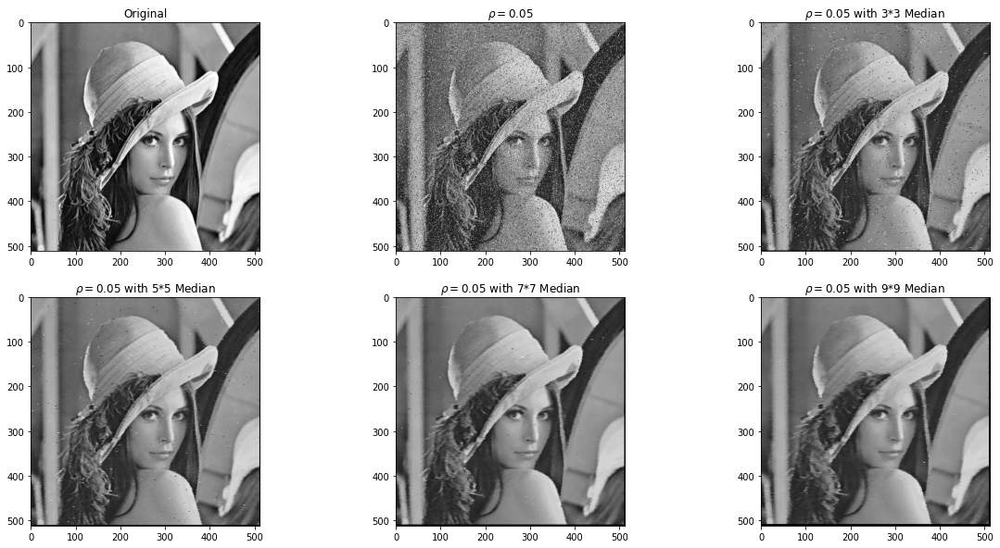

In [107]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.05$")
plt.imshow(salt_and_pepper_005, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.05$ with 3*3 Median")
plt.imshow(median_filter_results[0], cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.05$ with 5*5 Median")
plt.imshow(median_filter_results[1], cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.05$ with 7*7 Median")
plt.imshow(median_filter_results[2], cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.05$ with 9*9 Median")
plt.imshow(median_filter_results[3], cmap='gray')

plt.show()

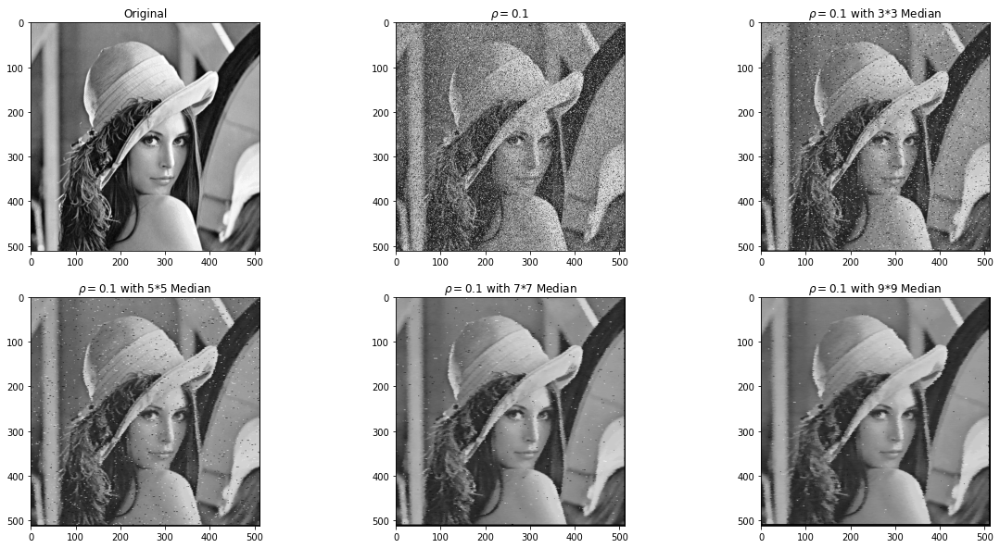

In [108]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.1$")
plt.imshow(salt_and_pepper_01, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.1$ with 3*3 Median")
plt.imshow(median_filter_results[4], cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.1$ with 5*5 Median")
plt.imshow(median_filter_results[5], cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.1$ with 7*7 Median")
plt.imshow(median_filter_results[6], cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.1$ with 9*9 Median")
plt.imshow(median_filter_results[7], cmap='gray')

plt.show()

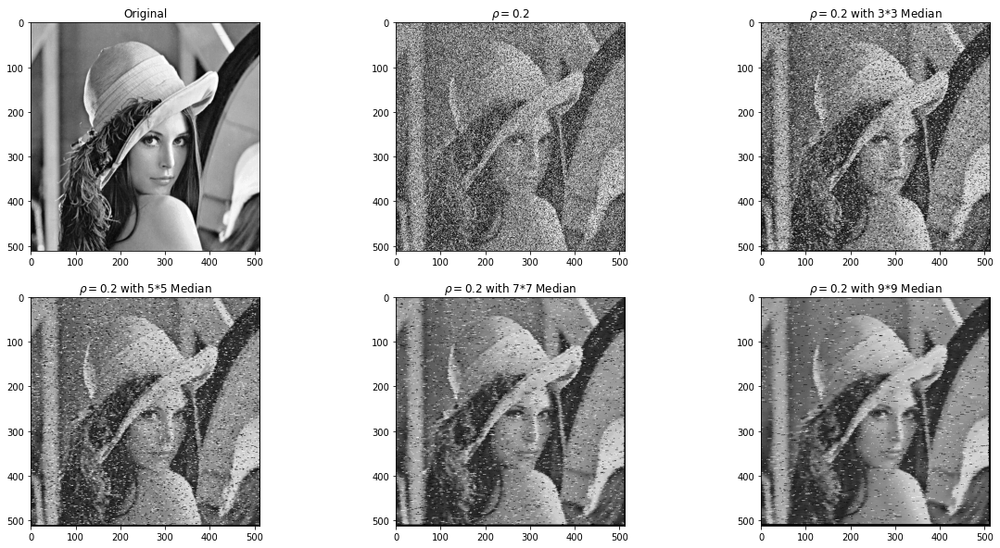

In [109]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.2$")
plt.imshow(salt_and_pepper_02, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.2$ with 3*3 Median")
plt.imshow(median_filter_results[8], cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.2$ with 5*5 Median")
plt.imshow(median_filter_results[9], cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.2$ with 7*7 Median")
plt.imshow(median_filter_results[10], cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.2$ with 9*9 Median")
plt.imshow(median_filter_results[11], cmap='gray')

plt.show()

In [110]:
cv2.imwrite('./Output Images/3/Median_Filter_33_005.bmp', median_filter_results[0])
cv2.imwrite('./Output Images/3/Median_Filter_55_005.bmp', median_filter_results[1])
cv2.imwrite('./Output Images/3/Median_Filter_77_005.bmp', median_filter_results[2])
cv2.imwrite('./Output Images/3/Median_Filter_99_005.bmp', median_filter_results[3])

cv2.imwrite('./Output Images/3/Median_Filter_33_01.bmp', median_filter_results[4])
cv2.imwrite('./Output Images/3/Median_Filter_55_01.bmp', median_filter_results[5])
cv2.imwrite('./Output Images/3/Median_Filter_77_01.bmp', median_filter_results[6])
cv2.imwrite('./Output Images/3/Median_Filter_99_01.bmp', median_filter_results[7])

cv2.imwrite('./Output Images/3/Median_Filter_33_02.bmp', median_filter_results[8])
cv2.imwrite('./Output Images/3/Median_Filter_55_02.bmp', median_filter_results[9])
cv2.imwrite('./Output Images/3/Median_Filter_77_02.bmp', median_filter_results[10])
cv2.imwrite('./Output Images/3/Median_Filter_99_02.bmp', median_filter_results[11])

True

###### Report MSE

In [111]:
mse_005_3 = mse(src, median_filter_results[0])
mse_005_5 = mse(src, median_filter_results[1])
mse_005_7 = mse(src, median_filter_results[2])
mse_005_9 = mse(src, median_filter_results[3])

mse_01_3 = mse(src, median_filter_results[4])
mse_01_5 = mse(src, median_filter_results[5])
mse_01_7 = mse(src, median_filter_results[6])
mse_01_9 = mse(src, median_filter_results[7])

mse_02_3 = mse(src, median_filter_results[8])
mse_02_5 = mse(src, median_filter_results[9])
mse_02_7 = mse(src, median_filter_results[10])
mse_02_9 = mse(src, median_filter_results[11])

In [112]:
data = {'3*3': [mse_005_3, mse_01_3, mse_02_3],
        '5*5': [mse_005_5, mse_01_5, mse_02_5],
        '7*7': [mse_005_7, mse_01_7, mse_02_7],
        '9*9': [mse_005_9, mse_01_9, mse_02_9]
        }
index =['$\rho = 0.05$','$\rho = 0.1$', '$\rho = 0.2$']
df = pd.DataFrame(data, index=index)

In [113]:
df['best window size'] = df.idxmin(axis=1)

In [114]:
df.head()

,3*3,5*5,7*7,9*9,best window size
$\rho = 0.05$,376.043854,362.383373,587.993587,827.622948,5*5
$\rho = 0.1$,1143.300720,656.567184,684.594738,873.367100,5*5
$\rho = 0.2$,3945.883121,2448.839020,1855.492977,1610.431828,9*9


**3.2.2. Create a program for adding Gaussian noise with different variance and filtering using average and median filter,
respectively. Apply the averaging filter and the median filter to an image with Gaussian noise (with a chosen
noise variance) and with salt-and-pepper noise (with a chosen noise density). Discuss the effectiveness of each
filter on this type of noise. Note: You can use imnoise and immse functions to generate noisy images and compare
the quality of images, respectively. (Test on grayscale Lena Image).**

In [12]:
src = cv2.imread(src_path, cv2.IMREAD_GRAYSCALE)
height, width = src.shape

In [7]:
def create_gaussian_distro(mean, variance, shape):
    return np.random.normal(mean, variance, shape)

In [8]:
def add_gaussian_noise(mean, variance, shape):
    noise = create_gaussian_distro(mean, variance, shape)
    noise = noise.reshape(shape[0], shape[1])
    return src + noise

In [24]:
gaussian_noisey_001 = add_gaussian_noise(0, 0.01, (height, width))
gaussian_noisey_005 = add_gaussian_noise(0, 0.05, (height, width))
gaussian_noisey_01 = add_gaussian_noise(0, 0.1, (height, width))

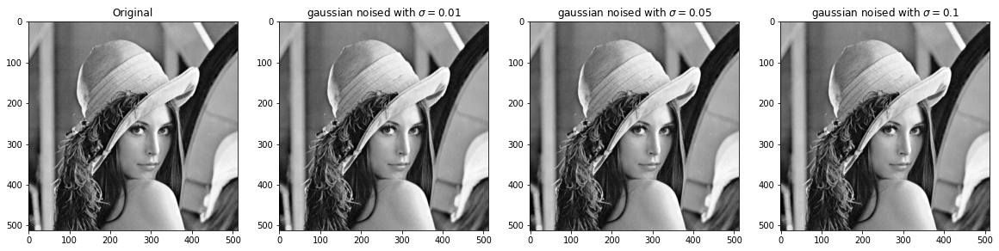

In [27]:
plt.figure(figsize=(20,10))

plt.subplot(1, 4, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(1, 4, 2)
plt.title(r"gaussian noised with $\sigma = 0.01$")
plt.imshow(gaussian_noisey_001, cmap='gray')

plt.subplot(1, 4, 3)
plt.title(r"gaussian noised with $\sigma = 0.05$")
plt.imshow(gaussian_noisey_005, cmap='gray')

plt.subplot(1, 4, 4)
plt.title(r"gaussian noised with $\sigma = 0.1$")
plt.imshow(gaussian_noisey_01, cmap='gray')

plt.show()

In [97]:
cv2.imwrite('./Output Images/3/gaussian_noise_001.bmp', gaussian_noisey_001)
cv2.imwrite('./Output Images/3/gaussian_noise_005.bmp', gaussian_noisey_005)
cv2.imwrite('./Output Images/3/gaussian_noise_01.bmp', gaussian_noisey_01)

True

In [28]:
salt_and_pepper_001 = add_salt_and_pepper(src, 0.01)
salt_and_pepper_005 = add_salt_and_pepper(src, 0.05)
salt_and_pepper_01 = add_salt_and_pepper(src, 0.1)

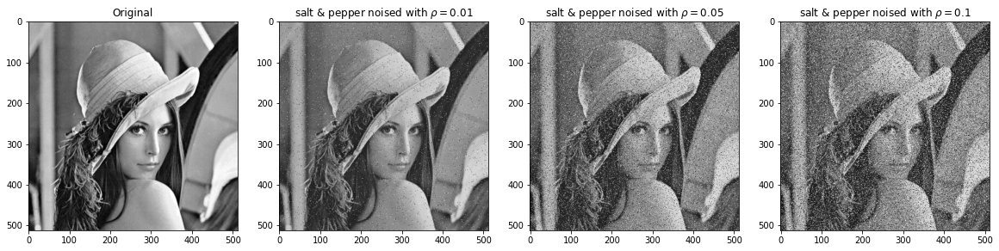

In [30]:
plt.figure(figsize=(20,10))

plt.subplot(1, 4, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(1, 4, 2)
plt.title(r"salt & pepper noised with $\rho = 0.01$")
plt.imshow(salt_and_pepper_001, cmap='gray')

plt.subplot(1, 4, 3)
plt.title(r"salt & pepper noised with $\rho = 0.05$")
plt.imshow(salt_and_pepper_005, cmap='gray')

plt.subplot(1, 4, 4)
plt.title(r"salt & pepper noised with $\rho = 0.1$")
plt.imshow(salt_and_pepper_01, cmap='gray')

plt.show()

In [98]:
cv2.imwrite('./Output Images/3/Salt_and_Pepper_noise_001.bmp', salt_and_pepper_001)
cv2.imwrite('./Output Images/3/Salt_and_Pepper_noise_005.bmp', salt_and_pepper_005)
cv2.imwrite('./Output Images/3/Salt_and_Pepper_noise_01.bmp', salt_and_pepper_01)

True

###### Box Filter

**Salt and Pepper noise**

In [31]:
kernel_sizes = [3, 5, 7, 9]
densities = [0.01, 0.05, 0.1]
box_filter_salt_pepper_results = []
for i in range(len(densities)):
    current_density = densities[i]
    print('current density= ' + str(current_density))
    for j in range(len(kernel_sizes)):
        current_kernel_size = kernel_sizes[j]
        print('current kernel size= ' + str(current_kernel_size))
        src_noised = add_salt_and_pepper(src, current_density)
        filtered_src = box_filter(src_noised, current_kernel_size)
        box_filter_salt_pepper_results.append(filtered_src)

current density= 0.01
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current density= 0.05
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current density= 0.1
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9


In [32]:
box_filter_salt_pepper_001_33 = box_filter_salt_pepper_results[0]
box_filter_salt_pepper_001_55 = box_filter_salt_pepper_results[1]
box_filter_salt_pepper_001_77 = box_filter_salt_pepper_results[2]
box_filter_salt_pepper_001_99 = box_filter_salt_pepper_results[3]

box_filter_salt_pepper_005_33 = box_filter_salt_pepper_results[4]
box_filter_salt_pepper_005_55 = box_filter_salt_pepper_results[5]
box_filter_salt_pepper_005_77 = box_filter_salt_pepper_results[6]
box_filter_salt_pepper_005_99 = box_filter_salt_pepper_results[7]

box_filter_salt_pepper_01_33 = box_filter_salt_pepper_results[8]
box_filter_salt_pepper_01_55 = box_filter_salt_pepper_results[9]
box_filter_salt_pepper_01_77 = box_filter_salt_pepper_results[10]
box_filter_salt_pepper_01_99 = box_filter_salt_pepper_results[11]

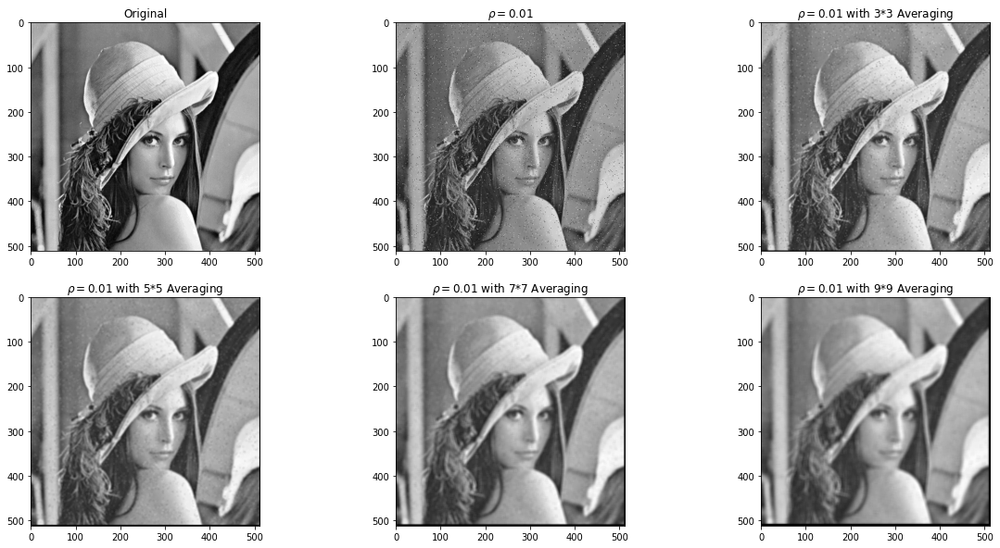

In [33]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.01$")
plt.imshow(salt_and_pepper_001, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.01$ with 3*3 Averaging")
plt.imshow(box_filter_salt_pepper_001_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.01$ with 5*5 Averaging")
plt.imshow(box_filter_salt_pepper_001_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.01$ with 7*7 Averaging")
plt.imshow(box_filter_salt_pepper_001_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.01$ with 9*9 Averaging")
plt.imshow(box_filter_salt_pepper_001_99, cmap='gray')

plt.show()

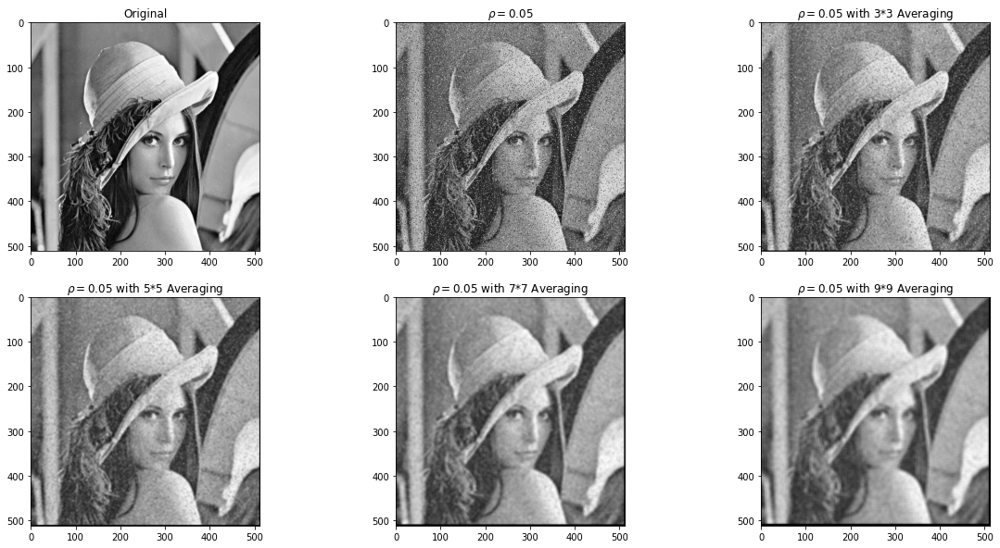

In [34]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.05$")
plt.imshow(salt_and_pepper_005, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.05$ with 3*3 Averaging")
plt.imshow(box_filter_salt_pepper_005_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.05$ with 5*5 Averaging")
plt.imshow(box_filter_salt_pepper_005_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.05$ with 7*7 Averaging")
plt.imshow(box_filter_salt_pepper_005_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.05$ with 9*9 Averaging")
plt.imshow(box_filter_salt_pepper_005_99, cmap='gray')

plt.show()

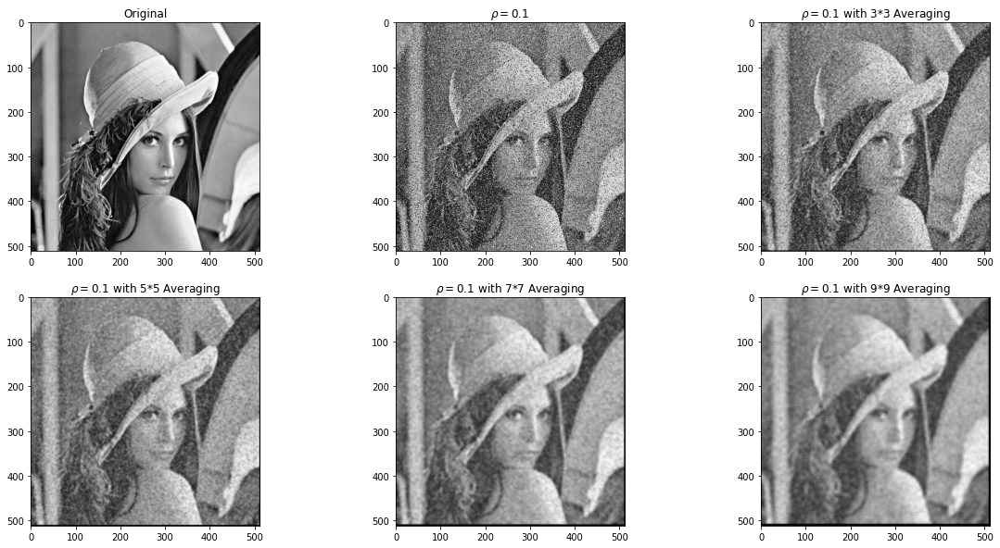

In [35]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.1$")
plt.imshow(salt_and_pepper_01, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.1$ with 3*3 Averaging")
plt.imshow(box_filter_salt_pepper_01_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.1$ with 5*5 Averaging")
plt.imshow(box_filter_salt_pepper_01_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.1$ with 7*7 Averaging")
plt.imshow(box_filter_salt_pepper_01_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.1$ with 9*9 Averaging")
plt.imshow(box_filter_salt_pepper_01_99, cmap='gray')

plt.show()

In [59]:
mse_box_sp_001_3 = mse(src, box_filter_salt_pepper_001_33)
mse_box_sp_001_5 = mse(src, box_filter_salt_pepper_001_55)
mse_box_sp_001_7 = mse(src, box_filter_salt_pepper_001_77)
mse_box_sp_001_9 = mse(src, box_filter_salt_pepper_001_99)

mse_box_sp_005_3 = mse(src, box_filter_salt_pepper_005_33)
mse_box_sp_005_5 = mse(src, box_filter_salt_pepper_005_55)
mse_box_sp_005_7 = mse(src, box_filter_salt_pepper_005_77)
mse_box_sp_005_9 = mse(src, box_filter_salt_pepper_005_99)

mse_box_sp_01_3 = mse(src, box_filter_salt_pepper_01_33)
mse_box_sp_01_5 = mse(src, box_filter_salt_pepper_01_55)
mse_box_sp_01_7 = mse(src, box_filter_salt_pepper_01_77)
mse_box_sp_01_9 = mse(src, box_filter_salt_pepper_01_99)

In [100]:
cv2.imwrite('./Output Images/3/Mean_Filter_Salt_and_Pepper_33_001.bmp', box_filter_salt_pepper_001_33)
cv2.imwrite('./Output Images/3/Mean_Filter_Salt_and_Pepper_55_001.bmp', box_filter_salt_pepper_001_55)
cv2.imwrite('./Output Images/3/Mean_Filter_Salt_and_Pepper_77_001.bmp', box_filter_salt_pepper_001_77)
cv2.imwrite('./Output Images/3/Mean_Filter_Salt_and_Pepper_99_001.bmp', box_filter_salt_pepper_001_99)

True

**Gaussian noise**

In [37]:
kernel_sizes = [3, 5, 7, 9]
variances = [0.01, 0.05, 0.1]
box_filter_gaussian_results = []
for i in range(len(variances)):
    current_variance = variances[i]
    print('current variance= ' + str(current_variance))
    for j in range(len(kernel_sizes)):
        current_kernel_size = kernel_sizes[j]
        print('current kernel size= ' + str(current_kernel_size))
        src_noised = add_gaussian_noise(src, current_variance, (height, width))
        filtered_src = box_filter(src_noised, current_kernel_size)
        box_filter_gaussian_results.append(filtered_src)

current variance= 0.01
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current variance= 0.05
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current variance= 0.1
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9


In [38]:
box_filter_gaussian_001_33 = box_filter_gaussian_results[0]
box_filter_gaussian_001_55 = box_filter_gaussian_results[1]
box_filter_gaussian_001_77 = box_filter_gaussian_results[2]
box_filter_gaussian_001_99 = box_filter_gaussian_results[3]

box_filter_gaussian_005_33 = box_filter_gaussian_results[4]
box_filter_gaussian_005_55 = box_filter_gaussian_results[5]
box_filter_gaussian_005_77 = box_filter_gaussian_results[6]
box_filter_gaussian_005_99 = box_filter_gaussian_results[7]

box_filter_gaussian_01_33 = box_filter_gaussian_results[8]
box_filter_gaussian_01_55 = box_filter_gaussian_results[9]
box_filter_gaussian_01_77 = box_filter_gaussian_results[10]
box_filter_gaussian_01_99 = box_filter_gaussian_results[11]

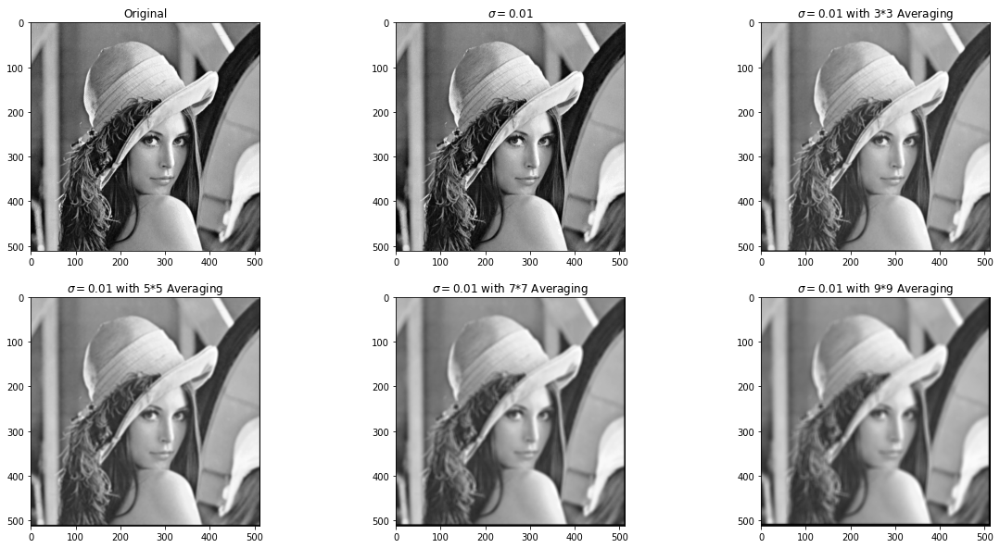

In [39]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\sigma = 0.01$")
plt.imshow(gaussian_noisey_001, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\sigma = 0.01$ with 3*3 Averaging")
plt.imshow(box_filter_gaussian_001_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\sigma = 0.01$ with 5*5 Averaging")
plt.imshow(box_filter_gaussian_001_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\sigma = 0.01$ with 7*7 Averaging")
plt.imshow(box_filter_gaussian_001_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\sigma = 0.01$ with 9*9 Averaging")
plt.imshow(box_filter_gaussian_001_99, cmap='gray')

plt.show()

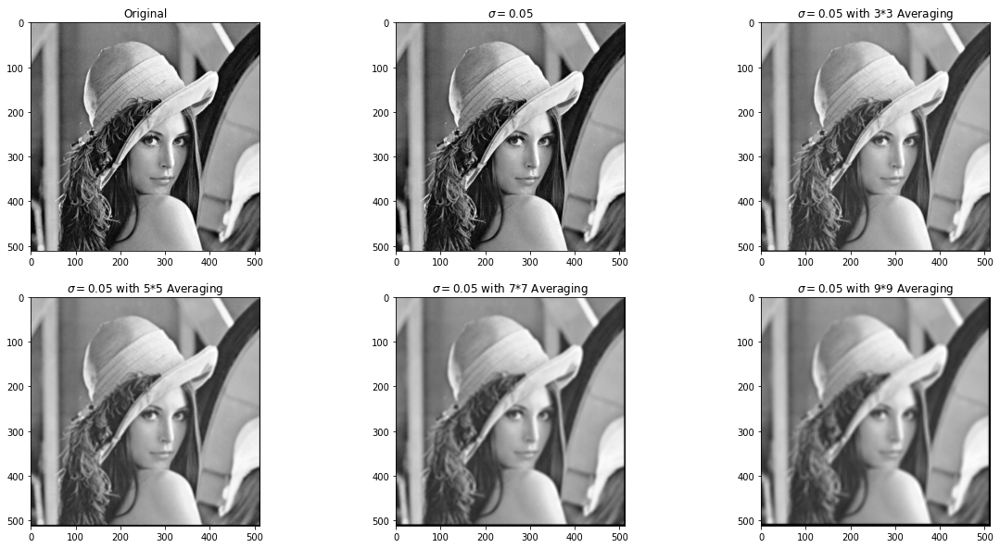

In [40]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\sigma = 0.05$")
plt.imshow(gaussian_noisey_005, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\sigma = 0.05$ with 3*3 Averaging")
plt.imshow(box_filter_gaussian_005_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\sigma = 0.05$ with 5*5 Averaging")
plt.imshow(box_filter_gaussian_005_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\sigma = 0.05$ with 7*7 Averaging")
plt.imshow(box_filter_gaussian_005_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\sigma = 0.05$ with 9*9 Averaging")
plt.imshow(box_filter_gaussian_005_99, cmap='gray')

plt.show()

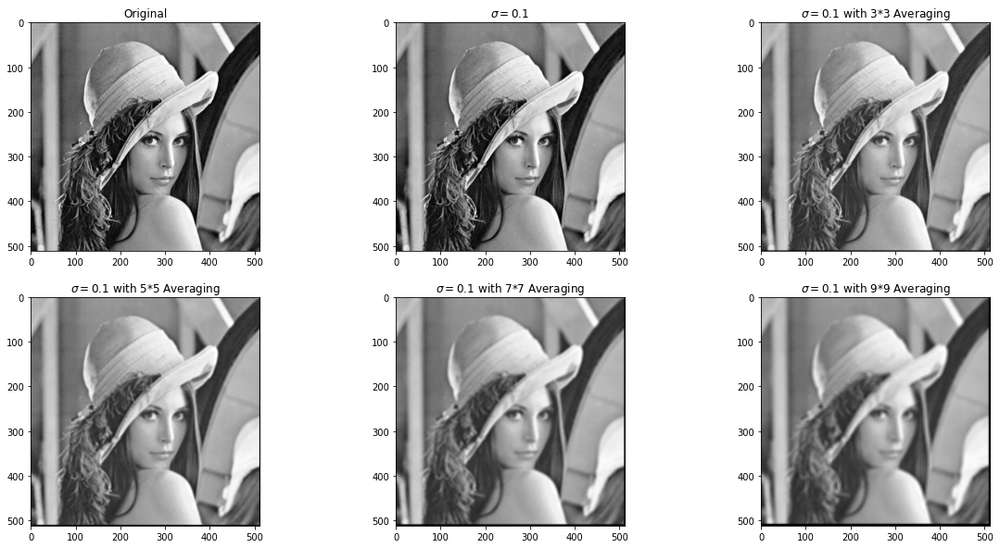

In [41]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\sigma = 0.1$")
plt.imshow(gaussian_noisey_01, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\sigma = 0.1$ with 3*3 Averaging")
plt.imshow(box_filter_gaussian_01_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\sigma = 0.1$ with 5*5 Averaging")
plt.imshow(box_filter_gaussian_01_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\sigma = 0.1$ with 7*7 Averaging")
plt.imshow(box_filter_gaussian_01_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\sigma = 0.1$ with 9*9 Averaging")
plt.imshow(box_filter_gaussian_01_99, cmap='gray')

plt.show()

In [60]:
mse_box_gaus_001_3 = mse(src, box_filter_gaussian_001_33)
mse_box_gaus_001_5 = mse(src, box_filter_gaussian_001_55)
mse_box_gaus_001_7 = mse(src, box_filter_gaussian_001_77)
mse_box_gaus_001_9 = mse(src, box_filter_gaussian_001_99)

mse_box_gaus_005_3 = mse(src, box_filter_gaussian_005_33)
mse_box_gaus_005_5 = mse(src, box_filter_gaussian_005_55)
mse_box_gaus_005_7 = mse(src, box_filter_gaussian_005_77)
mse_box_gaus_005_9 = mse(src, box_filter_gaussian_005_99)

mse_box_gaus_01_3 = mse(src, box_filter_gaussian_01_33)
mse_box_gaus_01_5 = mse(src, box_filter_gaussian_01_55)
mse_box_gaus_01_7 = mse(src, box_filter_gaussian_01_77)
mse_box_gaus_01_9 = mse(src, box_filter_gaussian_01_99)

In [101]:
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_33_001.bmp', box_filter_gaussian_001_33)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_55_001.bmp', box_filter_gaussian_001_55)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_77_001.bmp', box_filter_gaussian_001_77)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_99_001.bmp', box_filter_gaussian_001_99)

cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_33_005.bmp', box_filter_gaussian_005_33)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_55_005.bmp', box_filter_gaussian_005_55)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_77_005.bmp', box_filter_gaussian_005_77)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_99_005.bmp', box_filter_gaussian_005_99)

cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_33_01.bmp', box_filter_gaussian_01_33)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_55_01.bmp', box_filter_gaussian_01_55)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_77_01.bmp', box_filter_gaussian_01_77)
cv2.imwrite('./Output Images/3/Mean_Filter_Gaussian_99_01.bmp', box_filter_gaussian_01_99)

True

###### Median Filter

**Salt and Pepper**

In [42]:
kernel_sizes = [3, 5, 7, 9]
densities = [0.01, 0.05, 0.1]
median_filter_salt_pepper_results = []
for i in range(len(densities)):
    current_density = densities[i]
    print('current density= ' + str(current_density))
    for j in range(len(kernel_sizes)):
        current_kernel_size = kernel_sizes[j]
        print('current kernel size= ' + str(current_kernel_size))
        src_noised = add_salt_and_pepper(src, current_density)
        filtered_src = median_filter(src_noised, current_kernel_size)
        median_filter_salt_pepper_results.append(filtered_src)

current density= 0.01
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current density= 0.05
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current density= 0.1
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9


In [43]:
median_filter_salt_pepper_001_33 = median_filter_salt_pepper_results[0]
median_filter_salt_pepper_001_55 = median_filter_salt_pepper_results[1]
median_filter_salt_pepper_001_77 = median_filter_salt_pepper_results[2]
median_filter_salt_pepper_001_99 = median_filter_salt_pepper_results[3]

median_filter_salt_pepper_005_33 = median_filter_salt_pepper_results[4]
median_filter_salt_pepper_005_55 = median_filter_salt_pepper_results[5]
median_filter_salt_pepper_005_77 = median_filter_salt_pepper_results[6]
median_filter_salt_pepper_005_99 = median_filter_salt_pepper_results[7]

median_filter_salt_pepper_01_33 = median_filter_salt_pepper_results[8]
median_filter_salt_pepper_01_55 = median_filter_salt_pepper_results[9]
median_filter_salt_pepper_01_77 = median_filter_salt_pepper_results[10]
median_filter_salt_pepper_01_99 = median_filter_salt_pepper_results[11]

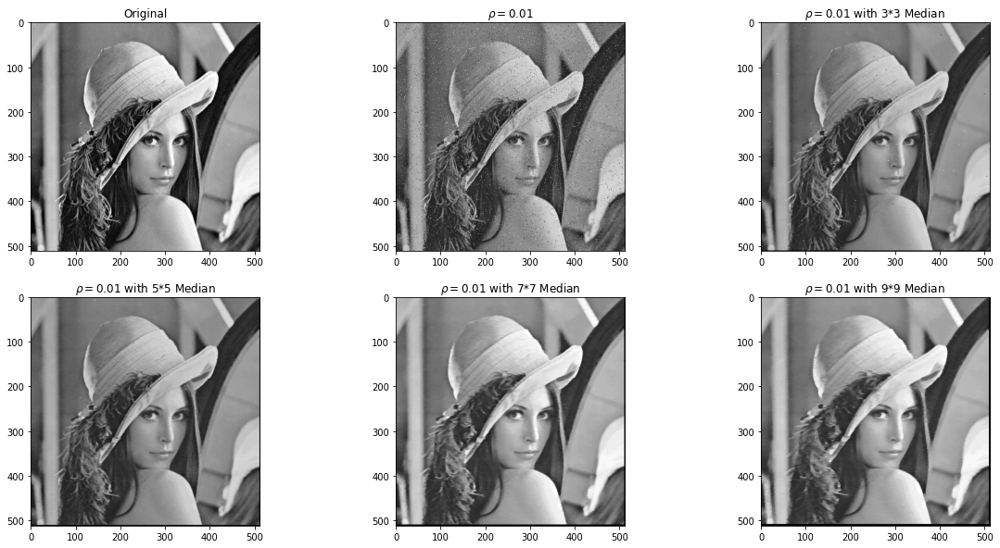

In [44]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.01$")
plt.imshow(salt_and_pepper_001, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.01$ with 3*3 Median")
plt.imshow(median_filter_salt_pepper_001_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.01$ with 5*5 Median")
plt.imshow(median_filter_salt_pepper_001_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.01$ with 7*7 Median")
plt.imshow(median_filter_salt_pepper_001_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.01$ with 9*9 Median")
plt.imshow(median_filter_salt_pepper_001_99, cmap='gray')

plt.show()

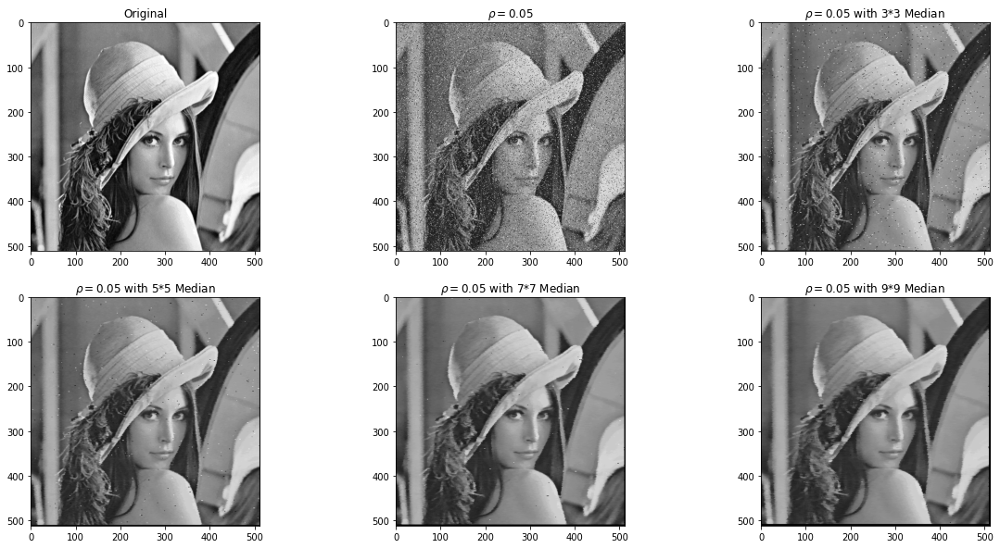

In [45]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.05$")
plt.imshow(salt_and_pepper_005, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.05$ with 3*3 Median")
plt.imshow(median_filter_salt_pepper_005_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.05$ with 5*5 Median")
plt.imshow(median_filter_salt_pepper_005_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.05$ with 7*7 Median")
plt.imshow(median_filter_salt_pepper_005_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.05$ with 9*9 Median")
plt.imshow(median_filter_salt_pepper_005_99, cmap='gray')

plt.show()

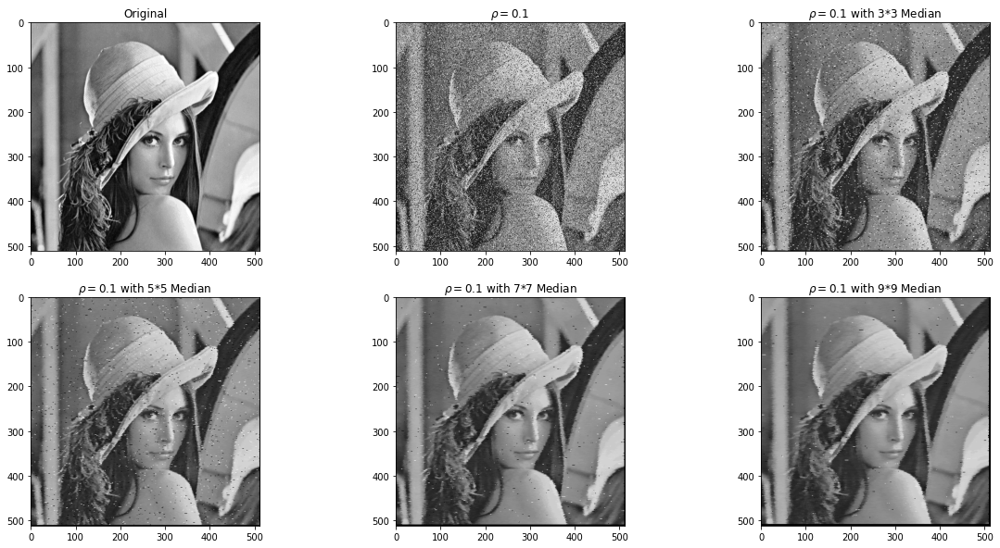

In [46]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\rho = 0.1$")
plt.imshow(salt_and_pepper_01, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\rho = 0.1$ with 3*3 Median")
plt.imshow(median_filter_salt_pepper_01_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\rho = 0.1$ with 5*5 Median")
plt.imshow(median_filter_salt_pepper_01_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\rho = 0.1$ with 7*7 Median")
plt.imshow(median_filter_salt_pepper_01_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\rho = 0.1$ with 9*9 Median")
plt.imshow(median_filter_salt_pepper_01_99, cmap='gray')

plt.show()

In [61]:
mse_median_sp_001_3 = mse(src, median_filter_salt_pepper_001_33)
mse_median_sp_001_5 = mse(src, median_filter_salt_pepper_001_55)
mse_median_sp_001_7 = mse(src, median_filter_salt_pepper_001_77)
mse_median_sp_001_9 = mse(src, median_filter_salt_pepper_001_99)

mse_median_sp_005_3 = mse(src, median_filter_salt_pepper_005_33)
mse_median_sp_005_5 = mse(src, median_filter_salt_pepper_005_55)
mse_median_sp_005_7 = mse(src, median_filter_salt_pepper_005_77)
mse_median_sp_005_9 = mse(src, median_filter_salt_pepper_005_99)

mse_median_sp_01_3 = mse(src, median_filter_salt_pepper_01_33)
mse_median_sp_01_5 = mse(src, median_filter_salt_pepper_01_55)
mse_median_sp_01_7 = mse(src, median_filter_salt_pepper_01_77)
mse_median_sp_01_9 = mse(src, median_filter_salt_pepper_01_99)

In [102]:
cv2.imwrite('./Output Images/3/Median_Filter_Salt_and_Pepper_33_001.bmp', median_filter_salt_pepper_001_33)
cv2.imwrite('./Output Images/3/Median_Filter_Salt_and_Pepper_55_001.bmp', median_filter_salt_pepper_001_55)
cv2.imwrite('./Output Images/3/Median_Filter_Salt_and_Pepper_77_001.bmp', median_filter_salt_pepper_001_77)
cv2.imwrite('./Output Images/3/Median_Filter_Salt_and_Pepper_99_001.bmp', median_filter_salt_pepper_001_99)

True

**Gaussian noise**

In [49]:
kernel_sizes = [3, 5, 7, 9]
variances = [0.01, 0.05, 0.1]
median_filter_gaussian_results = []
for i in range(len(densities)):
    current_variance = variances[i]
    print('current variance= ' + str(current_variance))
    for j in range(len(kernel_sizes)):
        current_kernel_size = kernel_sizes[j]
        print('current kernel size= ' + str(current_kernel_size))
        src_noised = add_gaussian_noise(src, current_variance, (height, width))
        filtered_src = median_filter(src_noised, current_kernel_size)
        median_filter_gaussian_results.append(filtered_src)

current variance= 0.01
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current variance= 0.05
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9
current variance= 0.1
current kernel size= 3
current kernel size= 5
current kernel size= 7
current kernel size= 9


In [50]:
median_filter_gaussian_001_33 = median_filter_gaussian_results[0]
median_filter_gaussian_001_55 = median_filter_gaussian_results[1]
median_filter_gaussian_001_77 = median_filter_gaussian_results[2]
median_filter_gaussian_001_99 = median_filter_gaussian_results[3]

median_filter_gaussian_005_33 = median_filter_gaussian_results[4]
median_filter_gaussian_005_55 = median_filter_gaussian_results[5]
median_filter_gaussian_005_77 = median_filter_gaussian_results[6]
median_filter_gaussian_005_99 = median_filter_gaussian_results[7]

median_filter_gaussian_01_33 = median_filter_gaussian_results[8]
median_filter_gaussian_01_55 = median_filter_gaussian_results[9]
median_filter_gaussian_01_77 = median_filter_gaussian_results[10]
median_filter_gaussian_01_99 = median_filter_gaussian_results[11]

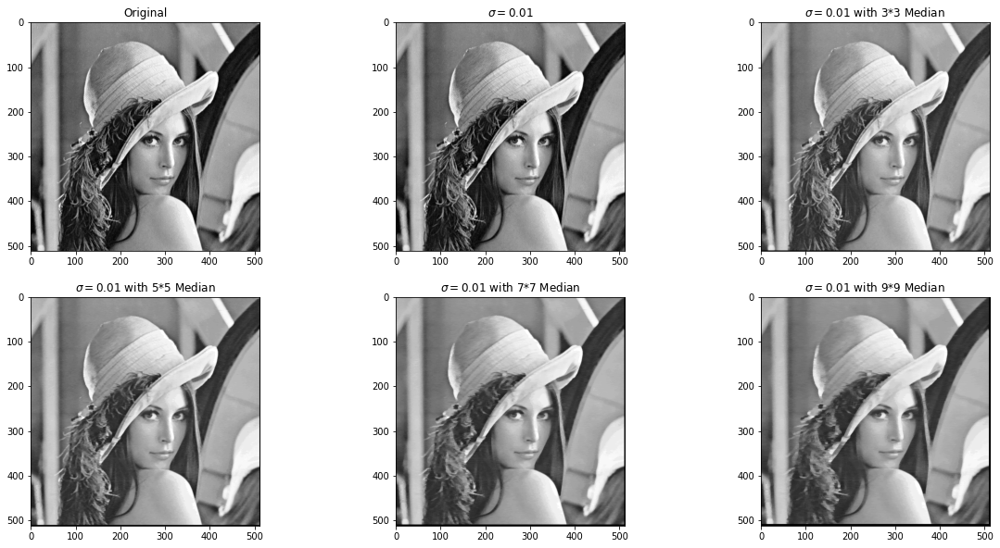

In [51]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\sigma = 0.01$")
plt.imshow(gaussian_noisey_001, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\sigma = 0.01$ with 3*3 Median")
plt.imshow(median_filter_gaussian_001_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\sigma = 0.01$ with 5*5 Median")
plt.imshow(median_filter_gaussian_001_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\sigma = 0.01$ with 7*7 Median")
plt.imshow(median_filter_gaussian_001_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\sigma = 0.01$ with 9*9 Median")
plt.imshow(median_filter_gaussian_001_99, cmap='gray')

plt.show()

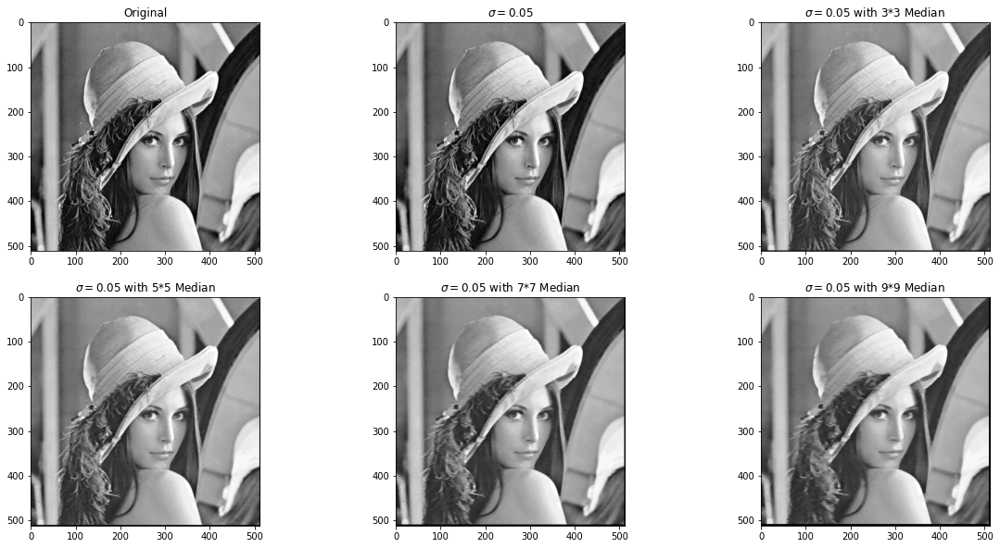

In [52]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\sigma = 0.05$")
plt.imshow(gaussian_noisey_005, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\sigma = 0.05$ with 3*3 Median")
plt.imshow(median_filter_gaussian_005_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\sigma = 0.05$ with 5*5 Median")
plt.imshow(median_filter_gaussian_005_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\sigma = 0.05$ with 7*7 Median")
plt.imshow(median_filter_gaussian_005_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\sigma = 0.05$ with 9*9 Median")
plt.imshow(median_filter_gaussian_005_99, cmap='gray')

plt.show()

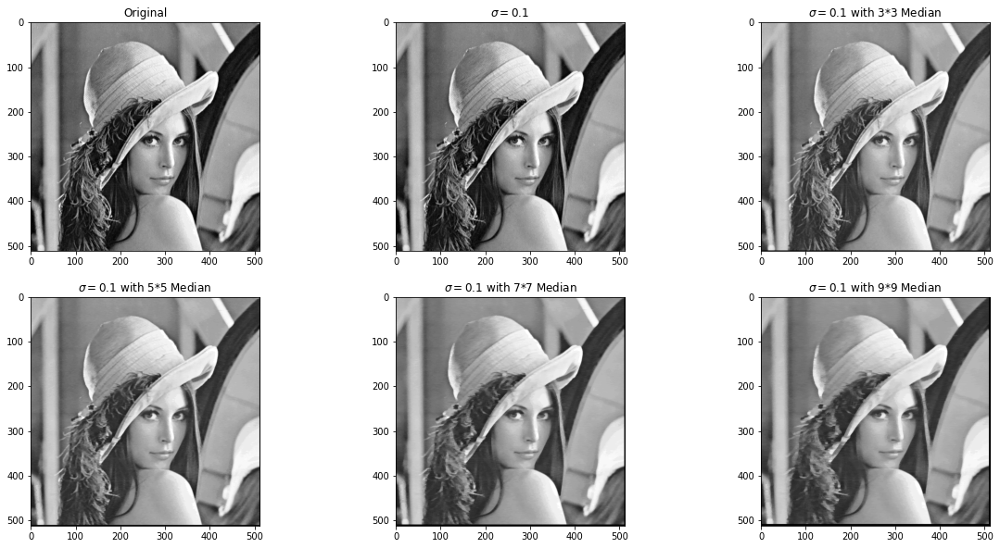

In [53]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"$\sigma = 0.1$")
plt.imshow(gaussian_noisey_01, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"$\sigma = 0.1$ with 3*3 Median")
plt.imshow(median_filter_gaussian_01_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"$\sigma = 0.1$ with 5*5 Median")
plt.imshow(median_filter_gaussian_01_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"$\sigma = 0.1$ with 7*7 Median")
plt.imshow(median_filter_gaussian_01_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"$\sigma = 0.1$ with 9*9 Median")
plt.imshow(median_filter_gaussian_01_99, cmap='gray')

plt.show()

In [62]:
mse_median_gaus_001_3 = mse(src, median_filter_gaussian_001_33)
mse_median_gaus_001_5 = mse(src, median_filter_gaussian_001_55)
mse_median_gaus_001_7 = mse(src, median_filter_gaussian_001_77)
mse_median_gaus_001_9 = mse(src, median_filter_gaussian_001_99)

mse_median_gaus_005_3 = mse(src, median_filter_gaussian_005_33)
mse_median_gaus_005_5 = mse(src, median_filter_gaussian_005_55)
mse_median_gaus_005_7 = mse(src, median_filter_gaussian_005_77)
mse_median_gaus_005_9 = mse(src, median_filter_gaussian_005_99)

mse_median_gaus_01_3 = mse(src, median_filter_gaussian_01_33)
mse_median_gaus_01_5 = mse(src, median_filter_gaussian_01_55)
mse_median_gaus_01_7 = mse(src, median_filter_gaussian_01_77)
mse_median_gaus_01_9 = mse(src, median_filter_gaussian_01_99)

In [103]:
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_33_001.bmp', median_filter_gaussian_001_33)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_55_001.bmp', median_filter_gaussian_001_55)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_77_001.bmp', median_filter_gaussian_001_77)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_99_001.bmp', median_filter_gaussian_001_99)

cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_33_005.bmp', median_filter_gaussian_005_33)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_55_005.bmp', median_filter_gaussian_005_55)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_77_005.bmp', median_filter_gaussian_005_77)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_99_005.bmp', median_filter_gaussian_005_99)

cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_33_01.bmp', median_filter_gaussian_01_33)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_55_01.bmp', median_filter_gaussian_01_55)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_77_01.bmp', median_filter_gaussian_01_77)
cv2.imwrite('./Output Images/3/Median_Filter_Gaussian_99_01.bmp', median_filter_gaussian_01_99)

True

###### Report MSE

In [63]:
data = {'Median 3*3': [mse_median_sp_001_3, mse_median_sp_005_3, mse_median_sp_01_3, mse_median_gaus_001_3, mse_median_gaus_005_3, mse_median_gaus_01_3],
        'Median 5*5': [mse_median_sp_001_5, mse_median_sp_005_5, mse_median_sp_01_3, mse_median_gaus_001_5, mse_median_gaus_005_5, mse_median_gaus_01_5],
        'Median 7*7': [mse_median_sp_001_7, mse_median_sp_005_7, mse_median_sp_01_7, mse_median_gaus_001_7, mse_median_gaus_005_7, mse_median_gaus_01_7],
        'Median 9*9': [mse_median_sp_001_9, mse_median_sp_005_9, mse_median_sp_01_9, mse_median_gaus_001_9, mse_median_gaus_005_9, mse_median_gaus_01_9],
        'Averaging 3*3': [mse_box_sp_001_3, mse_box_sp_005_3, mse_box_sp_01_3, mse_box_gaus_001_3, mse_box_gaus_005_3, mse_box_gaus_01_3],
        'Averaging 5*5': [mse_box_sp_001_5, mse_box_sp_005_5, mse_box_sp_01_5, mse_box_gaus_001_5, mse_box_gaus_005_5, mse_box_gaus_01_5],
        'Averaging 7*7': [mse_box_sp_001_7, mse_box_sp_005_7, mse_box_sp_01_7, mse_box_gaus_001_7, mse_box_gaus_005_7, mse_box_gaus_01_5],
        'Averaging 9*9': [mse_box_sp_001_9, mse_box_sp_005_9, mse_box_sp_01_9, mse_box_gaus_001_9, mse_box_gaus_005_9, mse_box_gaus_01_9],
        }
index =['Salt & Pepper $\rho = 0.01$',
        'Salt & Pepper $\rho = 0.05$', 
        'Salt & Pepper $\rho = 0.1$',
        'Gaussian $\sigma = 0.01$',
        'Gaussian $\sigma = 0.05$',
        'Gaussian $\sigma = 0.1$',
       ]
df = pd.DataFrame(data, index=index)

In [95]:
df['best window size'] = df.idxmin(axis=1)

In [96]:
df.head(len(index))

,Median 3*3,Median 5*5,Median 7*7,Median 9*9,Averaging 3*3,Averaging 5*5,Averaging 7*7,Averaging 9*9,best window size
Salt & Pepper $\rho = 0.01$,98.121281,301.790134,564.315411,810.770287,147.553971,292.108218,491.922497,690.485440,Median 3*3
Salt & Pepper $\rho = 0.05$,376.980511,361.766430,585.241535,826.744396,340.688077,371.028857,541.132079,720.736286,Averaging 3*3
Salt & Pepper $\rho = 0.1$,1173.978592,1173.978592,696.235069,882.742569,604.598531,520.475449,631.793033,788.877664,Averaging 5*5
Gaussian $\sigma = 0.01$,16774.352988,16989.987148,17321.717762,17636.765328,16657.300626,16699.143405,16815.799048,16932.912269,Averaging 3*3
Gaussian $\sigma = 0.05$,16774.259936,16989.839457,17321.486814,17636.563797,16657.288002,16699.137737,16815.827684,16932.983975,Averaging 3*3
Gaussian $\sigma = 0.1$,16774.124257,16989.557692,17321.165976,17636.291449,16657.236753,16699.104137,16699.104137,16932.921923,Averaging 3*3


## 3.3. Sharpening, Blurring, and Noising Removal

**3.3.1. Take blurry and noisy images (shooting in low light is a good way to get both) by your cellphone and try to improve
their appearance and legibility. Display and discuss the results before and after improving.**

In [67]:
src_path = './Images/3/my_image_01.jpg'
src = cv2.imread(src_path, cv2.IMREAD_GRAYSCALE)

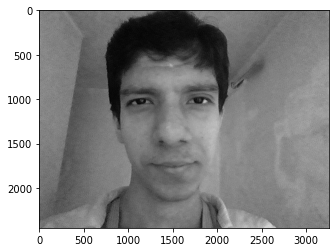

In [69]:
plt.imshow(src, cmap='gray')
plt.show()

In [89]:
src_denoised = cv2.fastNlMeansDenoising(src)

In [90]:
kernel_size = (5, 5)
border_type = cv2.BORDER_DEFAULT
src_denoised_blured = cv2.GaussianBlur(src_denoised, kernel_size, border_type)

In [91]:
alpha = 1.0 # weight of the first array elements.
beta = 2.0 # weight of the second array elements.
gamma = 0 # scalar added to each sum.
dst = cv2.addWeighted(src_denoised, alpha, src_denoised_blured, beta, gamma)

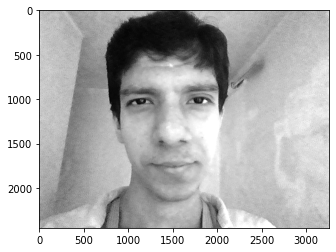

In [92]:
plt.imshow(dst, cmap='gray')
plt.show()

In [104]:
cv2.imwrite('./Output Images/3/my_image_01_improved.jpg', dst)

True

In [94]:
print('MSE between Original image and Improved one= ' + str(mse(src, dst)))

MSE between Original image and Improved one= 86.7634355876746


## 3.4. Edge Detection

**3.4.1. These are often used first-order difference filters in x-direction:**

$$a = \frac{1}{2}[1, 0, -1], \quad b = \frac{1}{6}\begin{bmatrix} 1 & 0 & -1 \\ 1 & 0 & -1 \\ 1 & 0 & -1 \end{bmatrix}, \quad c = \frac{1}{8}\begin{bmatrix} 1 & 0 & -1 \\ 2 & 0 & -2 \\ 1 & 0 & -1 \end{bmatrix}$$

**Compare and describe the properties of the three filters; In the following discuss the efficiency of filters for edge
detection problems. Are these filters suitable for computing the 2-D gradient? (Test on grayscale Lena Image).**

**Filter a)**
- detects the vertical edges
- detects more edges than other two, because it requires just 2 pixels to be activated, but it's worth noting all these edges may not be real.
- has low computational cost.

**Filter b)**
- detects the vertical edges.
- detects fewer edges than Filter a, because it requires 4 pixels to be activated.

**Filter c)**
- detects the vertical edges.
- detects fewer edges than Filter a, because it requires 4 pixels to be activated.

In [43]:
src_path = './Images/3/Lena.bmp'
src = cv2.imread(src_path, cv2.IMREAD_GRAYSCALE)

In [83]:
def filter(src, kernel):
    height, width = src.shape
    kernel_height, kernel_width = kernel.shape
    src_padded = pad(src, kernel_height // 2)
    dst = np.zeros_like(src, dtype=np.float32)
    for i in range(height):
        for j in range(width):
            value = np.sum(np.multiply(src_padded[i: i + kernel_height, j: j + kernel_width], kernel))
            dst[i, j] = value

    return dst.astype(np.uint8)

In [82]:
kernel_a = np.array([1, 0, -1]) / 2
kernel_b = np.array([
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1]
]) / 6

kernel_c = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1]
]) / 8

In [84]:
dst_a = filter(src, kernel_a.reshape(3, 1))
dst_b = filter(src, kernel_b)
dst_c = filter(src, kernel_c)

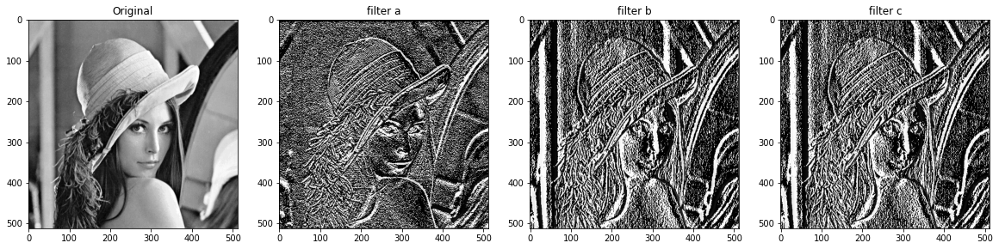

In [85]:
plt.figure(figsize=(20,10))

plt.subplot(1, 4, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(1, 4, 2)
plt.title("filter a")
plt.imshow(dst_a, cmap='gray')

plt.subplot(1, 4, 3)
plt.title("filter b")
plt.imshow(dst_b, cmap='gray')

plt.subplot(1, 4, 4)
plt.title("filter c")
plt.imshow(dst_c, cmap='gray')

plt.show()

In [86]:
cv2.imwrite('./Output Images/3/filter_a.bmp', dst_a)
cv2.imwrite('./Output Images/3/filter_b.bmp', dst_b)
cv2.imwrite('./Output Images/3/filter_c.bmp', dst_c)

True

**3.4.2. Robert suggested the filter to compute the 2-D gradient and to detect edges.**

$$a = \begin{bmatrix} 1 & 0 \\ 0 & -1 \end{bmatrix}, \quad b = \begin{bmatrix} 0 & 1 \\ -1 & 0 \\ \end{bmatrix}$$

**First, in which directions do these filters detect edges? Second, compare the quality of this filter with the filter
from previous steps. (Test on grayscale Lena Image)**

**Filter a)**
- detects the vertical edges because it calculates the vertical derivative estimation.
- detects more detailed edges than Filters b, c in previous section.
- has low computational cost.

**Filter b)**
- detects the horizontal edges because it calculates the horizontal derivative estimation.
- detects more detailed edges than Filters b, c in previous section.
- has low computational cost.

In [87]:
robert_x = np.array([[1, 0], [0, -1]])
robert_y = np.array([[0, 1], [-1, 0]])

dst_robert_x = filter(src, robert_x)
dst_robert_y = filter(src, robert_y)

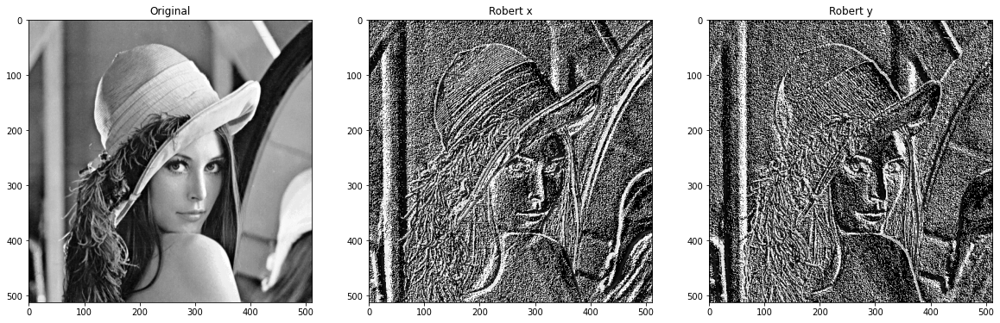

In [88]:
plt.figure(figsize=(20,10))

plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Robert x")
plt.imshow(dst_robert_x, cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Robert y")
plt.imshow(dst_robert_y, cmap='gray')


plt.show()

In [89]:
cv2.imwrite('./Output Images/3/robert_x.bmp', dst_robert_x)
cv2.imwrite('./Output Images/3/robert_y.bmp', dst_robert_y)

True

## 3.5. Unsharp Masking

**3.5.1. A simple unsharp masking filter has the following form:**

$$(1- \alpha)I + \alpha I^{\prime} \quad = I + \alpha(I^{\prime} - I)$$

**where 𝛼 ∈ [0, 1] represents the threshold step of strength sharpening and 𝐼′ is smoothed version of 𝐼 which
obtained using different filter sizes based on the gaussian filter. Compare and discuss the results for different
filter sizes (3, 5, 7, 9) and 𝛼 for the grayscale Lena image. What happens if we set 𝛼 very large or small? How to
obtain the optimum value? Note: You can use imgaussfilt function for smoothing.**

In [9]:
src_path = './Images/3/Lena.bmp'
src = cv2.imread(src_path, cv2.IMREAD_GRAYSCALE)

In [10]:
def unsharp_mask_filter(I, I_prime, alpha):
    return (1 - alpha) * I + alpha * I_prime

In [11]:
alpha_values = [0.2, 0.4, 0.6, 0.8]
kernel_sizes = [3, 5, 7, 9]
border_type = cv2.BORDER_DEFAULT

In [12]:
gaussian_blur_results = []
for i in range(len(kernel_sizes)):
    current_kernel_size = kernel_sizes[i]
    gaussian_blur_results.append(cv2.GaussianBlur(src, (current_kernel_size, current_kernel_size), border_type))

In [13]:
unsharped_masked_filter_results = []
for i in range(len(alpha_values)):
    current_alpha = alpha_values[i]
    for j in range(len(kernel_sizes)):
        current_src_blured = gaussian_blur_results[j]
        unsharped_masked_filter_results.append(unsharp_mask_filter(src, current_src_blured, current_alpha))

In [14]:
gaussian_blur_3 = gaussian_blur_results[0]
gaussian_blur_5 = gaussian_blur_results[1]
gaussian_blur_7 = gaussian_blur_results[2]
gaussian_blur_9 = gaussian_blur_results[3]

In [41]:
cv2.imwrite('./Output Images/3/Gaussian_33.bmp', gaussian_blur_3)
cv2.imwrite('./Output Images/3/Gaussian_55.bmp', gaussian_blur_5)
cv2.imwrite('./Output Images/3/Gaussian_77.bmp', gaussian_blur_7)
cv2.imwrite('./Output Images/3/Gaussian_99.bmp', gaussian_blur_9)

True

In [15]:
unsharped_masked_filter_gaussian_02_33 = unsharped_masked_filter_results[0]
unsharped_masked_filter_gaussian_02_55 = unsharped_masked_filter_results[1]
unsharped_masked_filter_gaussian_02_77 = unsharped_masked_filter_results[2]
unsharped_masked_filter_gaussian_02_99 = unsharped_masked_filter_results[3]

unsharped_masked_filter_gaussian_04_33 = unsharped_masked_filter_results[4]
unsharped_masked_filter_gaussian_04_55 = unsharped_masked_filter_results[5]
unsharped_masked_filter_gaussian_04_77 = unsharped_masked_filter_results[6]
unsharped_masked_filter_gaussian_04_99 = unsharped_masked_filter_results[7]

unsharped_masked_filter_gaussian_06_33 = unsharped_masked_filter_results[8]
unsharped_masked_filter_gaussian_06_55 = unsharped_masked_filter_results[9]
unsharped_masked_filter_gaussian_06_77 = unsharped_masked_filter_results[10]
unsharped_masked_filter_gaussian_06_99 = unsharped_masked_filter_results[11]

unsharped_masked_filter_gaussian_08_33 = unsharped_masked_filter_results[12]
unsharped_masked_filter_gaussian_08_55 = unsharped_masked_filter_results[13]
unsharped_masked_filter_gaussian_08_77 = unsharped_masked_filter_results[14]
unsharped_masked_filter_gaussian_08_99 = unsharped_masked_filter_results[15]

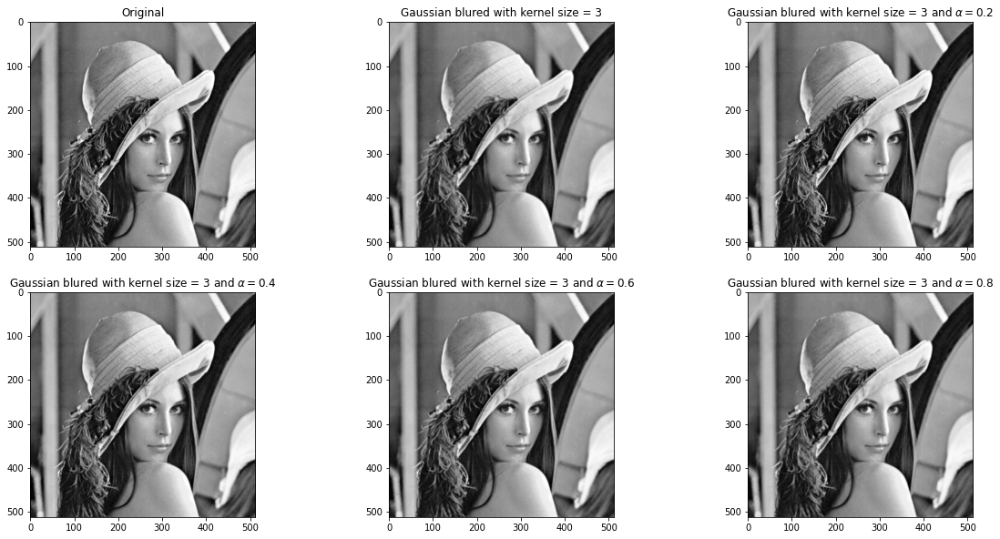

In [16]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"Gaussian blured with kernel size = 3")
plt.imshow(gaussian_blur_3, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"Gaussian blured with kernel size = 3 and $\alpha = 0.2$")
plt.imshow(unsharped_masked_filter_gaussian_02_33, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"Gaussian blured with kernel size = 3 and $\alpha = 0.4$")
plt.imshow(unsharped_masked_filter_gaussian_04_33, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"Gaussian blured with kernel size = 3 and $\alpha = 0.6$")
plt.imshow(unsharped_masked_filter_gaussian_06_33, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"Gaussian blured with kernel size = 3 and $\alpha = 0.8$")
plt.imshow(unsharped_masked_filter_gaussian_08_33, cmap='gray')

plt.show()

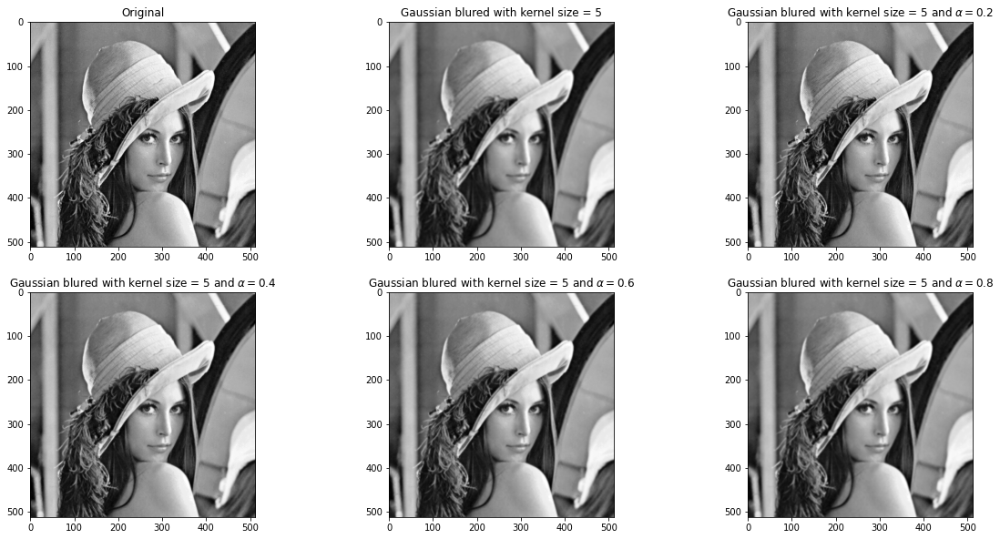

In [17]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"Gaussian blured with kernel size = 5")
plt.imshow(gaussian_blur_5, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"Gaussian blured with kernel size = 5 and $\alpha = 0.2$")
plt.imshow(unsharped_masked_filter_gaussian_02_55, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"Gaussian blured with kernel size = 5 and $\alpha = 0.4$")
plt.imshow(unsharped_masked_filter_gaussian_04_55, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"Gaussian blured with kernel size = 5 and $\alpha = 0.6$")
plt.imshow(unsharped_masked_filter_gaussian_06_55, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"Gaussian blured with kernel size = 5 and $\alpha = 0.8$")
plt.imshow(unsharped_masked_filter_gaussian_08_55, cmap='gray')

plt.show()

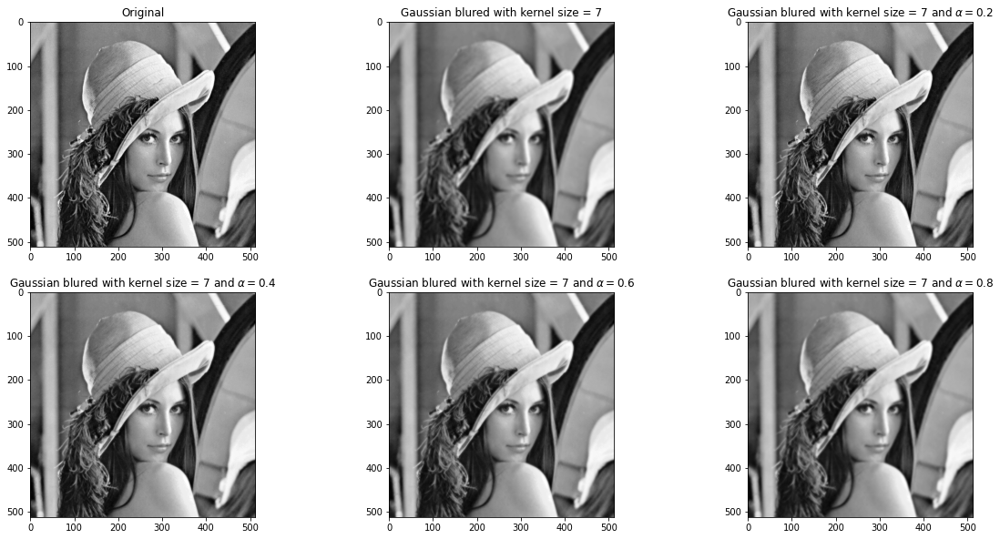

In [18]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"Gaussian blured with kernel size = 7")
plt.imshow(gaussian_blur_7, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"Gaussian blured with kernel size = 7 and $\alpha = 0.2$")
plt.imshow(unsharped_masked_filter_gaussian_02_77, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"Gaussian blured with kernel size = 7 and $\alpha = 0.4$")
plt.imshow(unsharped_masked_filter_gaussian_04_77, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"Gaussian blured with kernel size = 7 and $\alpha = 0.6$")
plt.imshow(unsharped_masked_filter_gaussian_06_77, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"Gaussian blured with kernel size = 7 and $\alpha = 0.8$")
plt.imshow(unsharped_masked_filter_gaussian_08_77, cmap='gray')

plt.show()

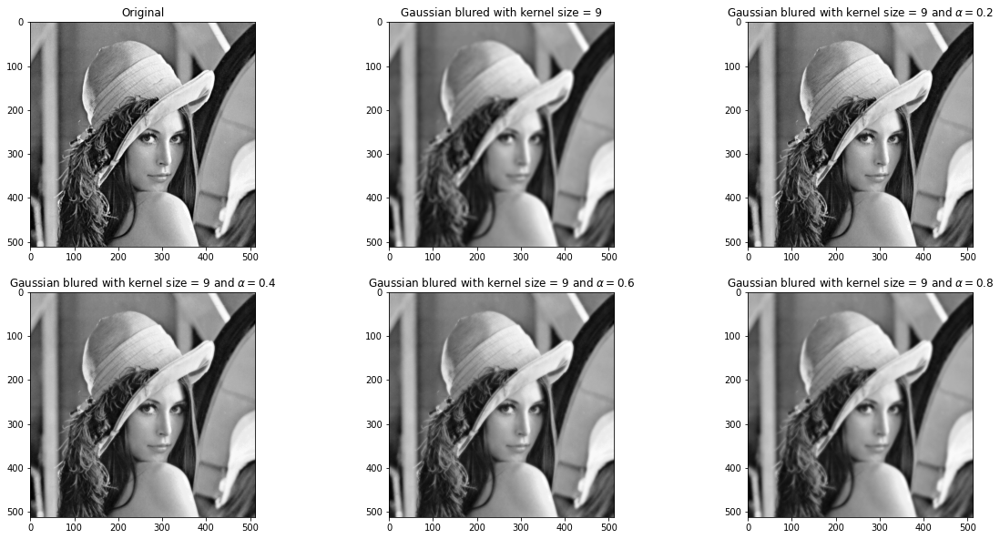

In [19]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("Original")
plt.imshow(src, cmap='gray')

plt.subplot(2, 3, 2)
plt.title(r"Gaussian blured with kernel size = 9")
plt.imshow(gaussian_blur_9, cmap='gray')

plt.subplot(2, 3, 3)
plt.title(r"Gaussian blured with kernel size = 9 and $\alpha = 0.2$")
plt.imshow(unsharped_masked_filter_gaussian_02_99, cmap='gray')

plt.subplot(2, 3, 4)
plt.title(r"Gaussian blured with kernel size = 9 and $\alpha = 0.4$")
plt.imshow(unsharped_masked_filter_gaussian_04_99, cmap='gray')

plt.subplot(2, 3, 5)
plt.title(r"Gaussian blured with kernel size = 9 and $\alpha = 0.6$")
plt.imshow(unsharped_masked_filter_gaussian_06_99, cmap='gray')

plt.subplot(2, 3, 6)
plt.title(r"Gaussian blured with kernel size = 9 and $\alpha = 0.8$")
plt.imshow(unsharped_masked_filter_gaussian_08_99, cmap='gray')

plt.show()

In [20]:
mse_unsharped_masked_gaus_02_3 = mse(src, unsharped_masked_filter_gaussian_02_33)
mse_unsharped_masked_gaus_02_5 = mse(src, unsharped_masked_filter_gaussian_02_55)
mse_unsharped_masked_gaus_02_7 = mse(src, unsharped_masked_filter_gaussian_02_77)
mse_unsharped_masked_gaus_02_9 = mse(src, unsharped_masked_filter_gaussian_02_99)

mse_unsharped_masked_gaus_04_3 = mse(src, unsharped_masked_filter_gaussian_04_33)
mse_unsharped_masked_gaus_04_5 = mse(src, unsharped_masked_filter_gaussian_04_55)
mse_unsharped_masked_gaus_04_7 = mse(src, unsharped_masked_filter_gaussian_04_77)
mse_unsharped_masked_gaus_04_9 = mse(src, unsharped_masked_filter_gaussian_04_99)

mse_unsharped_masked_gaus_06_3 = mse(src, unsharped_masked_filter_gaussian_06_33)
mse_unsharped_masked_gaus_06_5 = mse(src, unsharped_masked_filter_gaussian_06_55)
mse_unsharped_masked_gaus_06_7 = mse(src, unsharped_masked_filter_gaussian_06_77)
mse_unsharped_masked_gaus_06_9 = mse(src, unsharped_masked_filter_gaussian_06_99)

mse_unsharped_masked_gaus_08_3 = mse(src, unsharped_masked_filter_gaussian_08_33)
mse_unsharped_masked_gaus_08_5 = mse(src, unsharped_masked_filter_gaussian_08_55)
mse_unsharped_masked_gaus_08_7 = mse(src, unsharped_masked_filter_gaussian_08_77)
mse_unsharped_masked_gaus_08_9 = mse(src, unsharped_masked_filter_gaussian_08_99)

In [42]:
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_33_02.bmp', unsharped_masked_filter_gaussian_02_33)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_55_02.bmp', unsharped_masked_filter_gaussian_02_55)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_77_02.bmp', unsharped_masked_filter_gaussian_02_77)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_99_02.bmp', unsharped_masked_filter_gaussian_02_99)

cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_33_04.bmp', unsharped_masked_filter_gaussian_04_33)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_55_04.bmp', unsharped_masked_filter_gaussian_04_55)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_77_04.bmp', unsharped_masked_filter_gaussian_04_77)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_99_04.bmp', unsharped_masked_filter_gaussian_04_99)

cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_33_06.bmp', unsharped_masked_filter_gaussian_06_33)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_55_06.bmp', unsharped_masked_filter_gaussian_06_55)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_77_06.bmp', unsharped_masked_filter_gaussian_06_77)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_99_06.bmp', unsharped_masked_filter_gaussian_06_99)

cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_33_08.bmp', unsharped_masked_filter_gaussian_08_33)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_55_08.bmp', unsharped_masked_filter_gaussian_08_55)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_77_08.bmp', unsharped_masked_filter_gaussian_08_77)
cv2.imwrite('./Output Images/3/Unsharp_Masked_Gaussian_99_08.bmp', unsharped_masked_filter_gaussian_08_99)


True

###### Report MSE

In [39]:
data = {'Gaussian 3*3': [mse_unsharped_masked_gaus_02_3, mse_unsharped_masked_gaus_04_3, mse_unsharped_masked_gaus_06_3, mse_unsharped_masked_gaus_08_3],
        'Gaussian 5*5': [mse_unsharped_masked_gaus_02_5, mse_unsharped_masked_gaus_04_5, mse_unsharped_masked_gaus_06_5, mse_unsharped_masked_gaus_08_5],
        'Gaussian 7*7': [mse_unsharped_masked_gaus_02_7, mse_unsharped_masked_gaus_04_7, mse_unsharped_masked_gaus_06_7, mse_unsharped_masked_gaus_08_7],
        'Gaussian 9*9': [mse_unsharped_masked_gaus_02_9, mse_unsharped_masked_gaus_04_9, mse_unsharped_masked_gaus_06_9, mse_unsharped_masked_gaus_08_9]
        }

index =['α = 0.2',
        'α = 0.4', 
        'α = 0.6',
        'α = 0.8'
       ]
df = pd.DataFrame(data, index=index)

In [40]:
df.head()

,Gaussian 3*3,Gaussian 5*5,Gaussian 7*7,Gaussian 9*9
α = 0.2,1.268977,2.914581,4.387998,5.660833
α = 0.4,5.075909,11.658324,17.551992,22.643331
α = 0.6,11.420796,26.231229,39.491981,50.947495
α = 0.8,20.303638,46.633296,70.207966,90.573325


## Resources

1. https://stackoverflow.com/questions/13208286/how-to-write-latex-in-ipython-notebook
2. https://jupyter-notebook.readthedocs.io/en/stable/examples/Notebook/Working%20With%20Markdown%20Cells.html#LaTeX-equations
3. https://personal.math.ubc.ca/~pwalls/math-python/jupyter/latex/
4. https://stackoverflow.com/questions/62719074/how-to-add-space-in-text-of-the-equation-jupyter-notebook
5. https://tex.stackexchange.com/questions/96558/my-prime-symbol-is-not-superscript
6. https://numpy.org/doc/stable/reference/generated/numpy.mean.html
7. https://numpy.org/doc/stable/reference/generated/numpy.pad.html
8. https://numpy.org/doc/stable/reference/generated/numpy.sort.html
9. https://stackoverflow.com/questions/46698921/latex-and-text-in-matplotlib-title
10.https://stackoverflow.com/questions/45947200/for-each-row-return-the-column-name-of-the-smallest-value-pandas
11.https://www.geeksforgeeks.org/change-data-type-of-given-numpy-array/
12. https://www.kite.com/python/answers/how-to-add-noise-to-a-signal-using-numpy-in-python
13. https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv
14. https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_photo/py_non_local_means/py_non_local_means.html
15. https://stackoverflow.com/questions/4993082/how-can-i-sharpen-an-image-in-opencv
16. https://www.tutorialkart.com/opencv/python/opencv-python-gaussian-image-smoothing/
17. https://docs.opencv.org/2.4/modules/core/doc/operations_on_arrays.html#addweighted
18. https://stackoverflow.com/questions/33832728/how-to-convert-cv2-addweighted-and-cv2-gaussianblur-into-matlab
19. https://stackoverflow.com/questions/52612045/replace-alpha-and-beta-to-greek-characters-in-panda-index-names
20. https://numpy.org/doc/stable/reference/generated/numpy.multiply.html